<a href="https://colab.research.google.com/github/ryabubaker/Network-Analysis-Actors-Collaboration/blob/main/ALGOPROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

df1 = pd.read_csv("/content/drive/MyDrive/ALGORITHMS_ALLFiles_project/movie-2000-2005.csv")
df2 = pd.read_csv("/content/drive/MyDrive/ALGORITHMS_ALLFiles_project/movie-2005-2009.csv")
df3 = pd.read_csv("/content/drive/MyDrive/ALGORITHMS_ALLFiles_project/movie-2009-2012.csv")
df4 = pd.read_csv("/content/drive/MyDrive/ALGORITHMS_ALLFiles_project/movie-2012-2015.csv")
df5 = pd.read_csv("/content/drive/MyDrive/ALGORITHMS_ALLFiles_project/movie-2015-2019.csv")
df6 = pd.read_csv("/content/drive/MyDrive/ALGORITHMS_ALLFiles_project/movie-2019-2023.csv")

In [ ]:
import pandas as pd

df1 = pd.read_csv("/content/movie-2000-2005.csv")
df2 = pd.read_csv("/content/movie-2005-2009.csv")
df3 = pd.read_csv("/content/movie-2009-2012.csv")
df4 = pd.read_csv("/content/movie-2012-2015.csv")
df5 = pd.read_csv("/content/movie-2015-2019.csv")
df6 = pd.read_csv("/content/movie-2019-2023.csv")

In [ ]:
!pip install python-igraph


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Cleaning the dataset**

In [ ]:
df1.head()



,Title,Year,Movie ID,Director,Stars,Votes
0,Secret Agents,2004,tt0356336,Frédéric Schoendoerffer,"('Vincent Cassel', 'Monica Bellucci', 'André D...",5.4
1,Rabbit-Proof Fence,2002,tt0252444,Phillip Noyce,"('Everlyn Sampi', 'Tianna Sansbury', 'Kenneth ...",7.4
2,Nanny McPhee,2005,tt0396752,Kirk Jones,"('Emma Thompson', 'Colin Firth', 'Angela Lansb...",6.6
3,Killing Cupid,2005,tt0389073,Michael Worth,"('Jenya Lano', 'Christa Sauls', 'Lorenzo Lamas...",5.3
4,Faith & Bullets,2005,tt0443503,Kingsly Martin,"('David Stokey', 'Kingsly Martin', 'Elise Ball...",6.8


In [ ]:
df = pd.concat([df6 ,df5 , df4 , df3 , df2 , df1])
print(df.shape)


(51917, 6)


In [ ]:
### Remove Nan Values
df.dropna(inplace= True)


In [ ]:
# Display the number of missing values in each column
print(df.isnull().sum())

Title       0
Year        0
Movie ID    0
Director    0
Stars       0
Votes       0
dtype: int64


In [ ]:

# Find and remove duplicate rows in the dataset
df.drop_duplicates(inplace=True)

In [ ]:
df.head()

,Title,Year,Movie ID,Director,Stars,Votes
0,Operation Mincemeat,2021,tt1879016,John Madden,"('Colin Firth', 'Matthew Macfadyen', 'Kelly Ma...",6.6
1,Foreigner's God,2022,tt8427592,Ifan Ifeanyi Michael,"('Nancy Isime', 'Ini Dima Okojie', 'Pete Edoch...",6.1
2,Runaway,2021,tt13019994,Ralph Smith,"('Giovanni Accettola', 'Ron Bauer', 'Veronica ...",8.4
3,Forever Not Maybe,2020,tt7189228,Christie Conochalla,"('Mandahla Rose', 'Marie Gibeault', 'Roxanne A...",6.4
4,Queen of Glory,2021,tt3890456,Nana Mensah,"('Nana Mensah', 'Meeko', 'Madeline Weinstein',...",6.5


**Cleaning Actors Names**

In [ ]:
def clean_actor_name(name):
    name = name.strip()  # Remove leading and trailing spaces
    return name

df['Stars'] = df['Stars'].apply(lambda actors: [clean_actor_name(actor) for actor in eval(actors)])

In [ ]:
df['Stars'].head()

0    [Colin Firth, Matthew Macfadyen, Kelly Macdona...
1    [Nancy Isime, Ini Dima Okojie, Pete Edochie, G...
2    [Giovanni Accettola, Ron Bauer, Veronica Bauer...
3    [Mandahla Rose, Marie Gibeault, Roxanne Alexia...
4    [Nana Mensah, Meeko, Madeline Weinstein, Purva...
Name: Stars, dtype: object

In [ ]:
min_movies = 2
actor_counts = df['Stars'].explode().value_counts()
relevant_actors = set(actor_counts[actor_counts >= min_movies].index)

df['Stars'] = df['Stars'].apply(lambda actors: [actor for actor in actors if actor in relevant_actors])

**Create the Graph**

In [ ]:
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
from collections import defaultdict
import seaborn as sns
import random
import community.community_louvain as community
#import igraph as ig
#from igraph import plot

In [ ]:
# Extract the actors' names from the "Stars" column
actors = []
for row in df.itertuples():
    for actor in row.Stars:
        actors.append(actor)
actors = list(set(actors))

# Create a graph
G = nx.Graph()

# Add nodes for actors
G.add_nodes_from(actors)

# Add edges between actors based on the movies they've acted in together
for row in df.itertuples():
    movie_title = row.Title
    actors = row.Stars
    for i in range(len(actors)):
        for j in range(i+1, len(actors)):
            actor1, actor2 = actors[i], actors[j]
            if G.has_edge(actor1, actor2):
                # update weight and add movie title to edge attributes
                G[actor1][actor2]['weight'] += 1
                G[actor1][actor2]['movies'].append(movie_title)
            else:
                # create new edge with weight and movie title
                G.add_edge(actor1, actor2, weight=1, movies=[movie_title])

In [ ]:
#Remove Selfloop edges from the Graph
G.remove_edges_from(nx.selfloop_edges(G))

# Remove nodes with empty or missing labels
empty_nodes = [n for n in G.nodes() if n == '']
G.remove_nodes_from(empty_nodes)

isolated_nodes = list(nx.isolates(G))
G.remove_nodes_from(isolated_nodes)

In [ ]:
df.shape

(43771, 6)

**Visualization of the Graph**

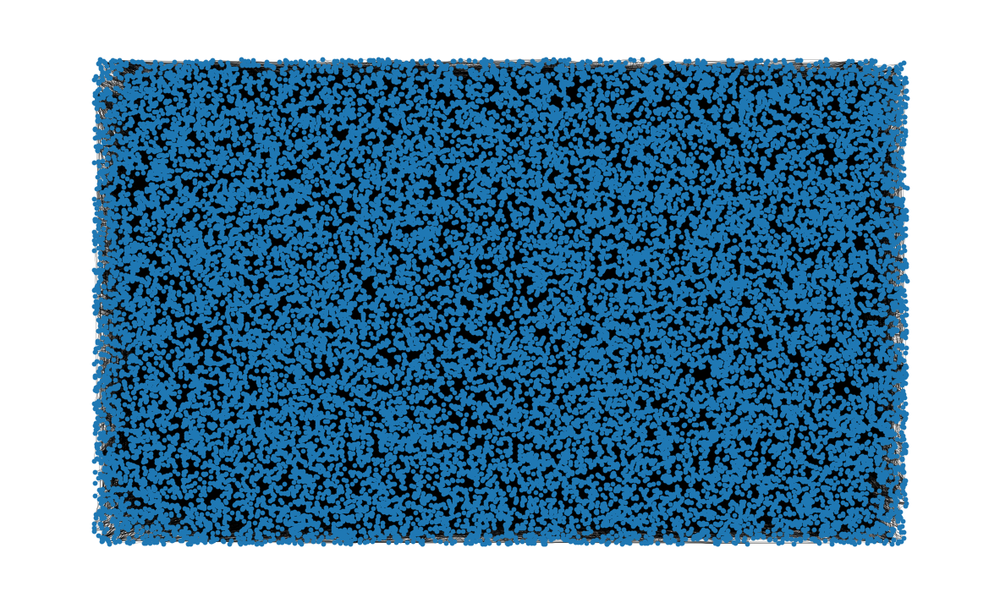

In [ ]:
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

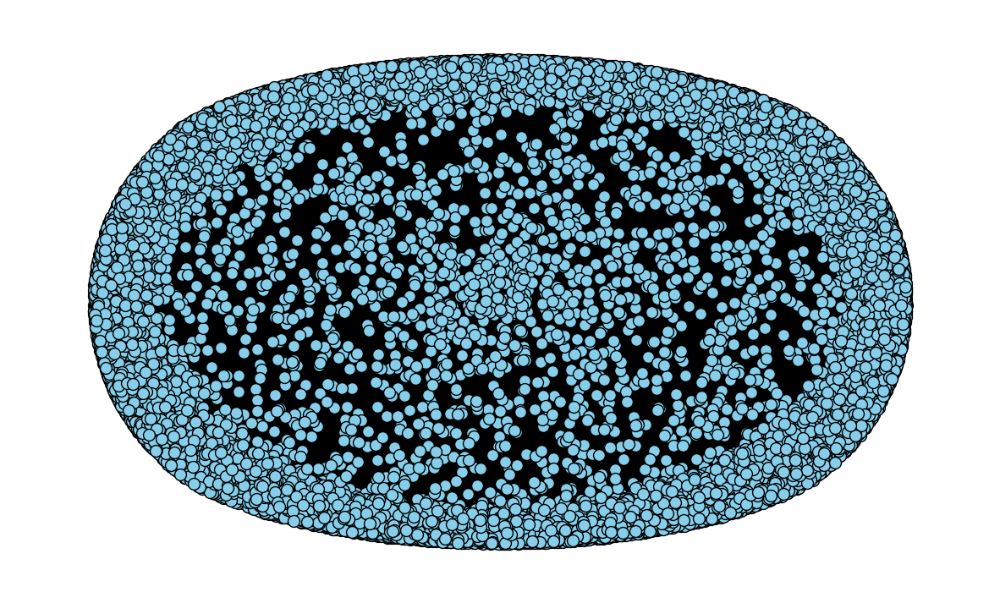

In [ ]:
# Assuming you have a graph 'G' already created
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")

# Use a better layout algorithm, such as the Fruchterman-Reingold force-directed algorithm
pos = nx.spring_layout(G, k=0.5, iterations=50)

# Increase node size, change the node color, and add a border around the nodes
plot_options = {
    "node_size": 100,
    "node_color": "skyblue",
    "edgecolors": "black",
    "linewidths": 1,
    "width": 0.5,
    "with_labels": False,
}

# Draw the graph
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

# Show the plot
plt.show()

Analysis of the subGraph taken by Random

In [ ]:
print("Number of nodes in subgraph:", subgraph.number_of_nodes())
print("Number of edges in subgraph:", subgraph.number_of_edges())


Number of nodes in subgraph: 2000
Number of edges in subgraph: 603


## **Basic Statistics**

In [ ]:
# Print some basic statistics about the graph
print("Nodes:", len(G.nodes))
print("Edges:", len(G.edges))
print("Connected:", nx.is_connected(G))

Nodes: 23351
Edges: 90151
Connected: False


# **Network Type**

In [ ]:
#Check if the graph is directed:
print("Directed Graph:", nx.is_directed(G))

Directed Graph: False


In [ ]:
#Check if the graph is weighted
is_weighted = 'weight' in G.edges[list(G.edges)[0]]
print("Weighted:", is_weighted)

Weighted: True


In [ ]:
is_multigraph = isinstance(G, (nx.MultiGraph, nx.MultiDiGraph))
print("Multigraph:", is_multigraph)

Multigraph: False


# **Density Analysis**

In [ ]:
graph_density = nx.density(G)
print("Density:", graph_density)

Density: 0.00033068018766213445


# **Degree Distribution Analysis**

In [ ]:
# Calculate degree sequence
degree_sequence = [d for n, d in G.degree()]

# Calculate average degree
average_degree = np.mean(degree_sequence)
print("Average Degree:", average_degree)

# Calculate degree variance
degree_variance = np.var(degree_sequence)
print("Degree Variance:", degree_variance)

# Find max and min degree
max_degree = max(degree_sequence)
min_degree = min(degree_sequence)
print("Max Degree:", max_degree)
print("Min Degree:", min_degree)

Average Degree: 7.721382381910839
Degree Variance: 115.89505005253359
Max Degree: 146
Min Degree: 1


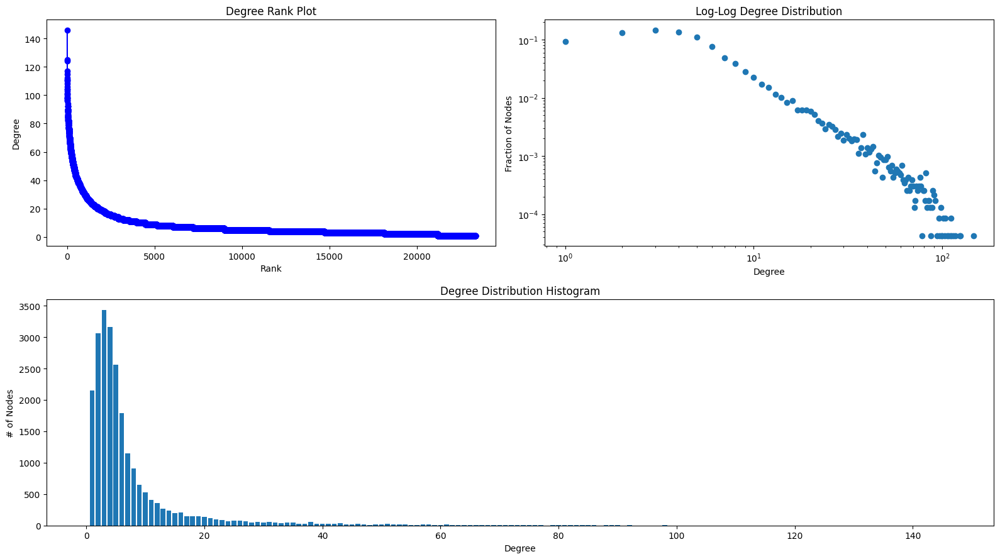

In [ ]:
# Calculate degree sequence and sort in descending order
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)

# Calculate degree histogram
degrees = dict(G.degree())
degree_values = sorted(set(degrees.values()))
histogram = [list(degrees.values()).count(i)/float(nx.number_of_nodes(G)) for i in degree_values]

# Create a figure with a grid of subplots
fig = plt.figure(figsize=(16, 9))

# Degree Rank Plot
ax1 = fig.add_subplot(2, 2, 1)
ax1.plot(degree_sequence, "b-", marker="o")
ax1.set_title("Degree Rank Plot")
ax1.set_ylabel("Degree")
ax1.set_xlabel("Rank")

# Log-Log Degree Distribution
ax2 = fig.add_subplot(2, 2, 2)
ax2.plot(degree_values, histogram, 'o')
ax2.set_title("Log-Log Degree Distribution")
ax2.set_xlabel("Degree")
ax2.set_ylabel("Fraction of Nodes")
ax2.set_xscale('log')
ax2.set_yscale('log')

# Degree Distribution Histogram
ax3 = fig.add_subplot(2, 1, 2)
ax3.bar(*np.unique(degree_sequence, return_counts=True))
ax3.set_title("Degree Distribution Histogram")
ax3.set_xlabel("Degree")
ax3.set_ylabel("# of Nodes")

# Adjust spacing between subplots and show the plot
fig.tight_layout()
plt.show()

**Bridges**

In [ ]:
#Check if the Graph has bridges or Not 
nx.has_bridges(G)

True

In [ ]:
bridges = list(nx.bridges(G))
len(bridges)

2408

In [ ]:
local_bridges = list(nx.local_bridges(G, with_span=False))
len(local_bridges)

7569


**Assortativity Cofficient**

In [ ]:
 #Calculate the assortativity coefficient of the graph
assortativity = nx.degree_assortativity_coefficient(G)
print('Assortativity coefficient:', assortativity)

Assortativity coefficient: 0.3980646101680582


In [ ]:
nx.degree_pearson_correlation_coefficient(G)

0.39806461016805667

# **Connected Component Analysis**

In [ ]:
components = list(nx.connected_components(G))
print("Connected components:", len(components))
print("Size of largest component:", max(len(c) for c in components))

Connected components: 536
Size of largest component: 21818


In [ ]:
import plotly.graph_objs as go

def visualize_largest_component_plotly(G):
    # Extract the largest connected component
    largest_component = max(nx.connected_components(G), key=len)
    largest_component_subgraph = G.subgraph(largest_component)

    # Choose a layout algorithm (e.g., spring_layout, circular_layout, etc.)
    pos = nx.spring_layout(largest_component_subgraph, seed=42)

    # Prepare data for Plotly
    edge_x = []
    edge_y = []
    for edge in largest_component_subgraph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')

    node_x = [pos[node][0] for node in largest_component_subgraph.nodes()]
    node_y = [pos[node][1] for node in largest_component_subgraph.nodes()]

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers', hoverinfo='text', marker=dict(showscale=True, colorscale='YlGnBu', reversescale=True, color=[], size=10, colorbar=dict(thickness=15, title='Node Connections', xanchor='left', titleside='right'), line_width=2))

    # Add node labels
    node_text = [f'{node}' for node in largest_component_subgraph.nodes()]
    node_trace.text = node_text

    # Create the figure
    fig = go.Figure(data=[edge_trace, node_trace], layout=go.Layout(title='Largest Component of Actor Network', titlefont_size=16, showlegend=False, hovermode='closest', margin=dict(b=20, l=5, r=5, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    # Show the figure
    fig.show()

# Assuming `G` is your actor network graph
visualize_largest_component_plotly(G)

# **Path Analysis**

In [ ]:
# Find the shortest path between two actors
actor1 = "Tom Cruise"
actor2 = "Meryl Streep"
shortest_path = nx.shortest_path(G, actor1, actor2)
print("Shortest path between", actor1, "and", actor2, ":", shortest_path)

Shortest path between Tom Cruise and Meryl Streep : ['Tom Cruise', 'Meryl Streep']


In [ ]:
actor1 = "Toni Collette"
actor2 = "Tom Cruise"
shortest_paths = nx.all_shortest_paths(G, source=actor1, target=actor2)
for path in shortest_paths:
    print(path)

['Toni Collette', 'Jesse Plemons', 'Tom Cruise']
['Toni Collette', 'Dakota Fanning', 'Tom Cruise']
['Toni Collette', 'Colin Farrell', 'Tom Cruise']
['Toni Collette', 'Philip Seymour Hoffman', 'Tom Cruise']
['Toni Collette', 'Cameron Diaz', 'Tom Cruise']
['Toni Collette', 'Alec Baldwin', 'Tom Cruise']


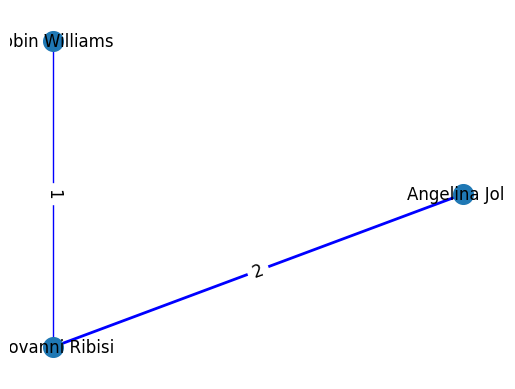

In [ ]:
# Find shortest path between two actors
shortest_path = nx.dijkstra_path(G, 'Angelina Jolie', 'Robin Williams')

# Create a subgraph of relevant actors and their connections
relevant_nodes = set(shortest_path + ['Angelina Jolie', 'Robin Williams'])
subgraph = G.subgraph(relevant_nodes)

# Draw the subgraph with circular layout
pos = nx.circular_layout(subgraph)
weights = [subgraph[u][v]['weight'] for u,v in subgraph.edges()]
nx.draw_networkx_nodes(subgraph, pos, node_size=200)
nx.draw_networkx_edges(subgraph, pos, width=weights, edge_color='b')
nx.draw_networkx_labels(subgraph, pos, font_size=12, font_family='sans-serif')

# Add edge labels with weights
edge_labels = {(u, v): subgraph[u][v]['weight'] for u, v in subgraph.edges()}
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=12)

plt.axis('off')
plt.show()

# **Centrality Analysis**

## **Closeness Centrality**

In [ ]:
# Calculate closeness centrality for each node
closeness_centrality = nx.closeness_centrality(G)

# Sort the nodes by closeness centrality in descending order
sorted_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)

# Print the top 20 nodes with the highest closeness centrality
top_20_nodes = sorted_closeness[:20]
print("Top 20 nodes with the highest closeness centrality:")
for node, centrality in top_20_nodes:
    print(f"{node} : {centrality}")

Top 20 nodes with the highest closeness centrality:
Nicolas Cage : 0.24964663347600985
Samuel L. Jackson : 0.24959466897491284
Willem Dafoe : 0.2489819011365315
Ryan Reynolds : 0.24647118963376427
James Franco : 0.24620922059388495
Julianne Moore : 0.24513445903351624
Forest Whitaker : 0.24475477523053227
Colin Farrell : 0.2446637086050879
Ewan McGregor : 0.24456390696992367
Antonio Banderas : 0.24412457587154773
Mark Wahlberg : 0.2440310561077671
Nicole Kidman : 0.2438675688170705
Ethan Hawke : 0.2433638906646225
Jake Gyllenhaal : 0.24305630526362984
Brian Cox : 0.2429404372628368
Naomi Watts : 0.24293464676260407
Dennis Quaid : 0.24288833269606688
Woody Harrelson : 0.24284782237133795
Robert De Niro : 0.24272926268858558
Vera Farmiga : 0.24261081871236234


<ipython-input-30-ef01d79860fe>:20: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


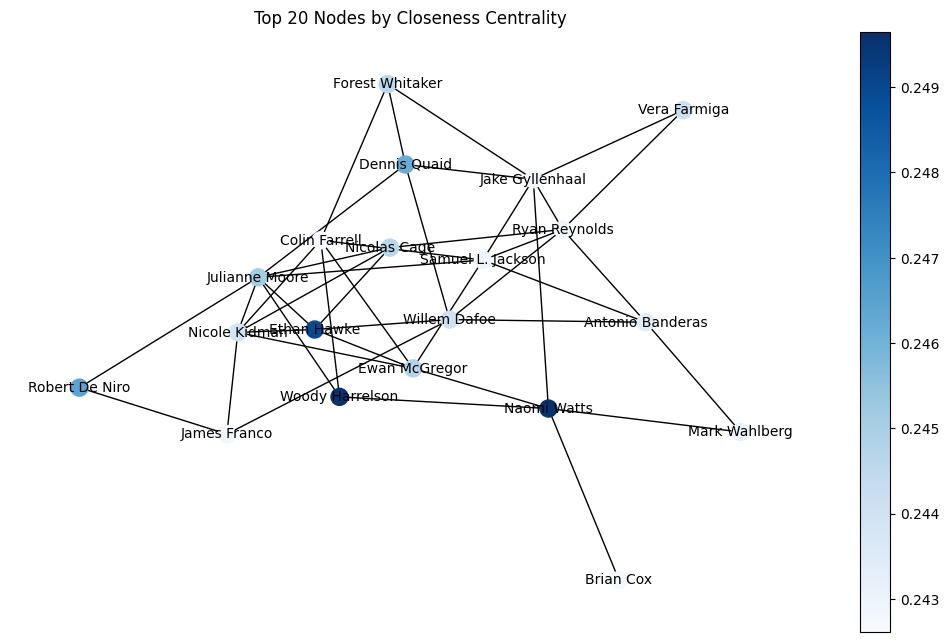

In [ ]:
# Generate node colors for top 20 nodes
node_color = [centrality for node, centrality in top_20_nodes]

# Generate a subgraph with only the top 20 nodes and their edges
subgraph = G.subgraph([node for node, centrality in top_20_nodes])

# Draw the subgraph with only the top 20 nodes
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos=pos, node_color=node_color, cmap=plt.cm.Blues, node_size=150)

# Draw labels for the top 20 nodes
node_labels = {node: node for node, centrality in top_20_nodes}
nx.draw_networkx_labels(subgraph, pos=pos, labels=node_labels, font_size=10)

# Add title and colorbar to the plot
plt.title('Top 20 Nodes by Closeness Centrality')
sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm._A = []
plt.colorbar(sm)

# Remove axis and show the plot
plt.axis('off')
plt.show()

## **Degree centrality**

In [ ]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Print the top 20 nodes by degree centrality
top20 = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
for node, centrality in top20:
    print(f"{node}: {centrality}")

Samuel L. Jackson: 0.0062526766595289085
Eric Roberts: 0.005353319057815846
Nicolas Cage: 0.005310492505353319
Ryan Reynolds: 0.005010706638115632
Willem Dafoe: 0.004925053533190578
Toni Collette: 0.004796573875802998
James Franco: 0.004753747323340472
Colin Farrell: 0.004753747323340472
Julianne Moore: 0.004710920770877944
Mark Wahlberg: 0.004625267665952891
Nicole Kidman: 0.004539614561027838
Liam Neeson: 0.004453961456102784
Woody Harrelson: 0.004453961456102784
Tom Sizemore: 0.004411134903640257
Ewan McGregor: 0.004325481798715203
Ethan Hawke: 0.004325481798715203
Robert De Niro: 0.004282655246252677
Forest Whitaker: 0.0042398286937901505
Morgan Freeman: 0.004197002141327623
Charlize Theron: 0.004197002141327623


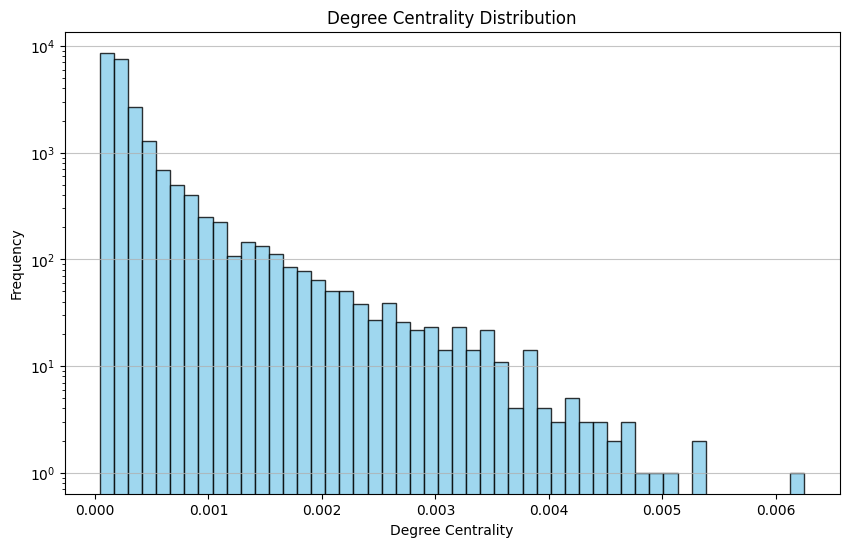

In [ ]:
# Extract the degree centrality values from the dictionary
degree_values = list(degree_centrality.values())

# Create a histogram
plt.figure(figsize=(10, 6))
plt.hist(degree_values, bins=50, color='skyblue', edgecolor='k', alpha=0.8)
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.yscale('log')
plt.title('Degree Centrality Distribution')
plt.grid(axis='y', alpha=0.75)
plt.show()

<ipython-input-18-68723fffe61c>:20: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


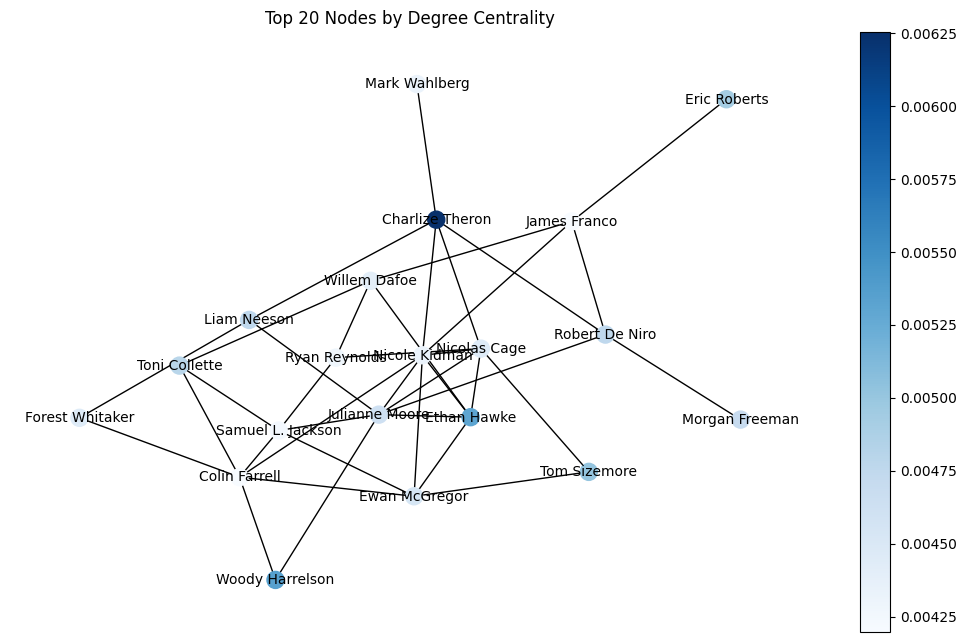

In [ ]:
# Generate node colors for top 20 nodes
node_color = [centrality for node, centrality in top20]

# Generate a subgraph with only the top 20 nodes and their edges
subgraph = G.subgraph([node for node, centrality in top20])

# Draw the subgraph with only the top 20 nodes
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos=pos, node_color=node_color, cmap=plt.cm.Blues, node_size=150)

# Draw labels for the top 20 nodes
node_labels = {node: node for node, centrality in top20}
nx.draw_networkx_labels(subgraph, pos=pos, labels=node_labels, font_size=10)

# Add title and colorbar to the plot
plt.title('Top 20 Nodes by Degree Centrality')
sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm._A = []
plt.colorbar(sm)

# Remove axis and show the plot
plt.axis('off')
plt.show()

## **Betweeness Centrality**

In [ ]:
# Calculate betweenness centrality for each node in the network
betweenness_centrality = nx.betweenness_centrality(G)

# Sort the nodes by betweenness centrality in descending order
sorted_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Print the top 20 nodes with the highest betweenness centrality
top_20_nodes = sorted_betweenness[:20]
print("Top 20 nodes with the highest betweenness centrality:")
for node, centrality in top_20_nodes:
    print(f"{node} : {centrality}")

Top 20 nodes with the highest betweenness centrality:
Eric Roberts : 0.029860669096622144
Tom Sizemore : 0.018433500726071497
Michael Madsen : 0.012636807170917537
James Franco : 0.010076101302864116
Vernon Wells : 0.009983170427878727
Willem Dafoe : 0.008710858072678502
Brian Cox : 0.008582300883102573
Dean Cain : 0.007992365901440016
Danny Trejo : 0.007885047136643182
Nicolas Cage : 0.007572836628644792
Corbin Bernsen : 0.007310286060377528
Bai Ling : 0.007188129091817903
Armand Assante : 0.007175316282188546
Keith David : 0.006995639628801751
Dee Wallace : 0.006853766641174289
Samuel L. Jackson : 0.006768885032383854
Robert Miano : 0.006677980312621036
Joe Estevez : 0.006415641767386293
Danny Glover : 0.005982656170783862
Juliette Binoche : 0.005742377630535599


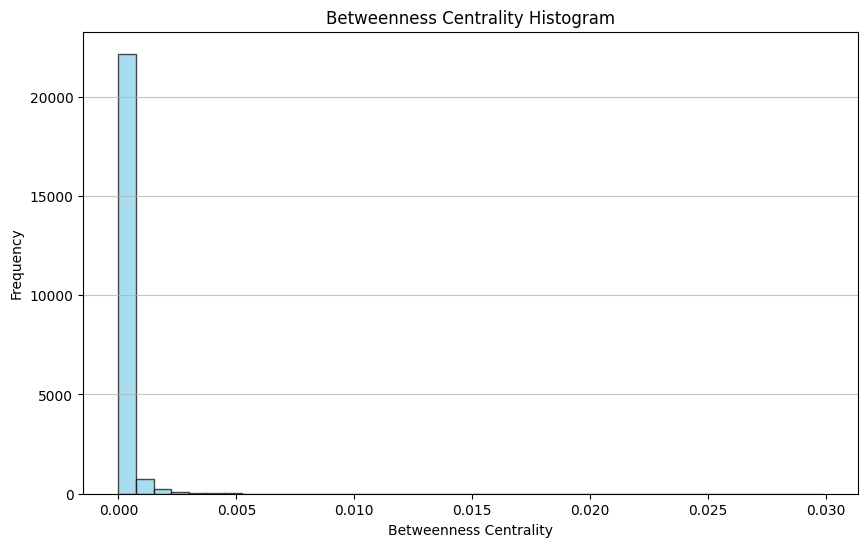

In [ ]:
betweenness_values = list(betweenness_centrality.values())

# Draw a customized histogram of betweenness centrality values
plt.figure(figsize=(10, 6))
plt.hist(betweenness_values, bins=40, color='skyblue', edgecolor='black', alpha=0.7)
plt.title("Betweenness Centrality Histogram")
plt.xlabel("Betweenness Centrality")
plt.ylabel("Frequency")
plt.grid(axis='y', alpha=0.75)
plt.show()

<ipython-input-24-e14fa7350dd0>:20: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


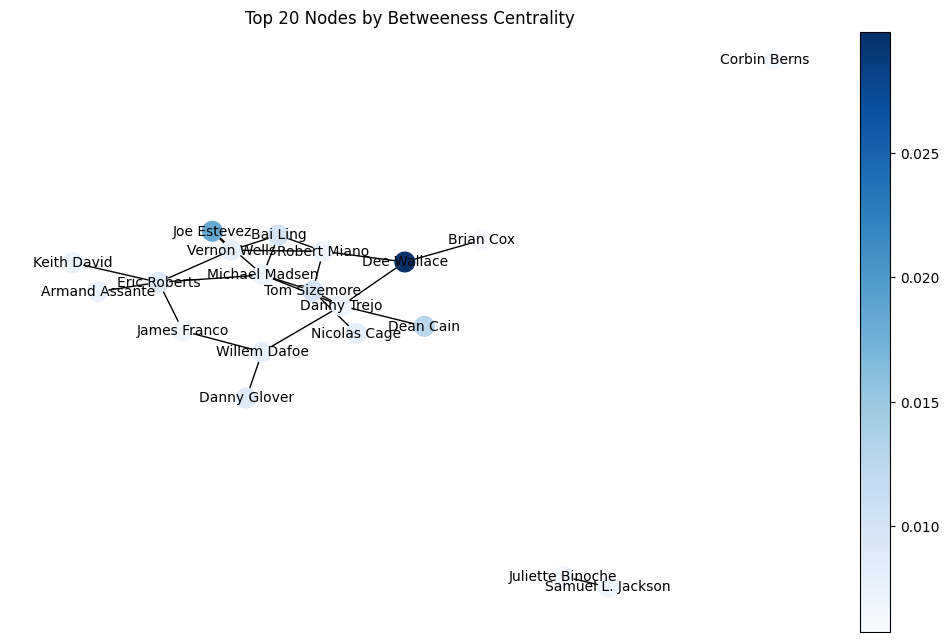

In [ ]:
# Generate node colors for top 20 nodes
node_color = [centrality for node, centrality in top_20_nodes]

# Generate a subgraph with only the top 20 nodes and their edges
subgraph = G.subgraph([node for node, centrality in top_20_nodes])

# Draw the subgraph with only the top 20 nodes
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos=pos, node_color=node_color, cmap=plt.cm.Blues, node_size=200)

# Draw labels for the top 20 nodes
node_labels = {node: node for node, centrality in top_20_nodes}
nx.draw_networkx_labels(subgraph, pos=pos, labels=node_labels, font_size=10)

# Add title and colorbar to the plot
plt.title('Top 20 Nodes by Betweeness Centrality')
sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm._A = []
plt.colorbar(sm)

# Remove axis and show the plot
plt.axis('off')
plt.show()

## **Eigenvector Centrality**

In [ ]:
# Calculate eigenvector centrality
centrality_eigenvector = nx.eigenvector_centrality(G)

# Print top 20 nodes by eigenvector centrality
top_nodes = sorted(centrality_eigenvector.items(), key=lambda x: x[1], reverse=True)[:20]
for node, centrality in top_nodes:
    print(f"{node}: {centrality}")


Samuel L. Jackson: 0.1006177518918609
Julianne Moore: 0.08959700245869862
Colin Farrell: 0.08770879075431622
Mark Wahlberg: 0.08761025625354942
Nicole Kidman: 0.08252149325369819
Matt Damon: 0.08101050503498622
Ryan Reynolds: 0.08046917221201359
Cate Blanchett: 0.07866259693628914
Christian Bale: 0.07777995583920251
Nicolas Cage: 0.075863153568224
Ewan McGregor: 0.07576479408517262
Woody Harrelson: 0.07388065166144815
Robert De Niro: 0.07258468096585384
Charlize Theron: 0.07135768287936077
Jude Law: 0.07078951972238526
Scarlett Johansson: 0.07006519691915881
Jake Gyllenhaal: 0.06948578919909681
Anthony Hopkins: 0.06931177674806138
Naomi Watts: 0.06927389122714231
Susan Sarandon: 0.06849594568980011


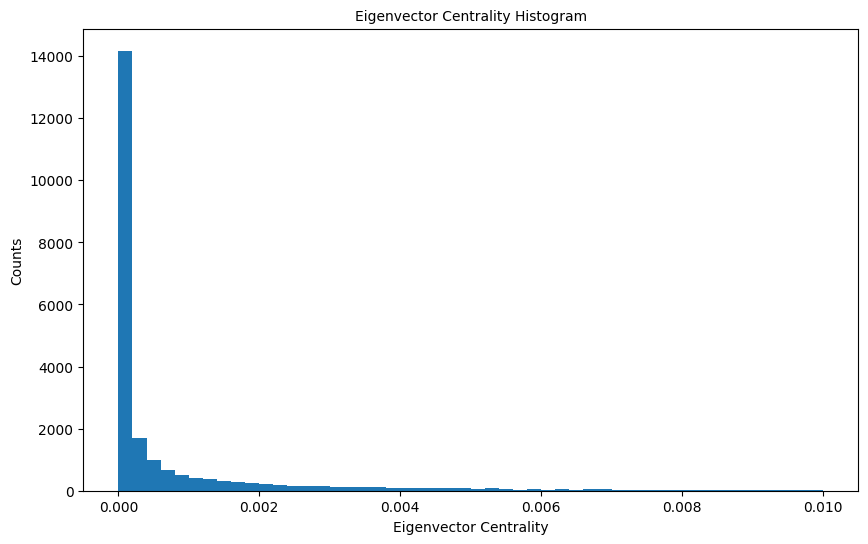

In [ ]:
# Get the eigenvector centrality values as a list
eigenvector_centrality_values = list(centrality_eigenvector.values())

# Set the range and number of bins for the histogram
bin_range = (0, 0.01)
num_bins = 50

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(eigenvector_centrality_values, bins=num_bins, range=bin_range)
plt.xticks(ticks=[0, 0.002, 0.004, 0.006, 0.008, 0.01])
plt.title("Eigenvector Centrality Histogram", fontdict={"size": 10}, loc="center")
plt.xlabel("Eigenvector Centrality", fontdict={"size": 10})
plt.ylabel("Counts", fontdict={"size": 10})
plt.show()

<ipython-input-31-696b8229b028>:20: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


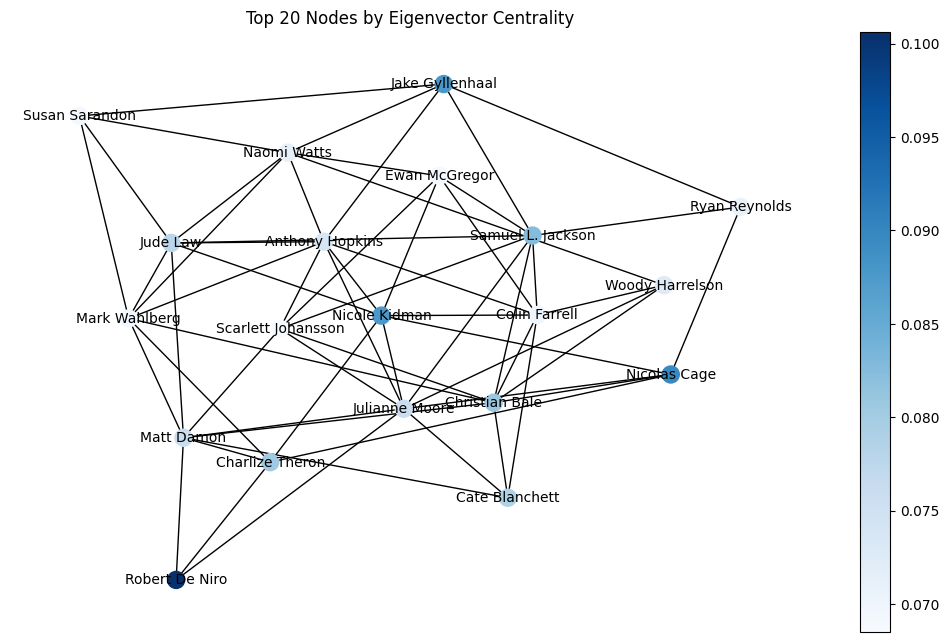

In [ ]:
# Generate node colors for top 20 nodes
node_color = [centrality_eigenvector[node] for node, centrality in top_nodes]

# Generate a subgraph with only the top 20 nodes and their edges
subgraph = G.subgraph([node for node, centrality in top_nodes])

# Draw the subgraph with only the top 20 nodes
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos=pos, node_color=node_color, cmap=plt.cm.Blues, node_size=150)

# Draw labels for the top 20 nodes
node_labels = {node: node for node, centrality in top_nodes}
nx.draw_networkx_labels(subgraph, pos=pos, labels=node_labels, font_size=10)

# Add title and colorbar to the plot
plt.title('Top 20 Nodes by Eigenvector Centrality')
sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm._A = []
plt.colorbar(sm)

# Remove axis and show the plot
plt.axis('off')
plt.show()

## **Clossness Centrality**

In [ ]:
# Calculate the closeness centrality
closeness_centrality = nx.closeness_centrality(G)

# Print the top 20 nodes with the highest closeness centrality
for node, closeness in sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:20]:
    print(f"{node}: {closeness}")

Nicolas Cage: 0.24964663347600985
Samuel L. Jackson: 0.24959466897491284
Willem Dafoe: 0.2489819011365315
Ryan Reynolds: 0.24647118963376427
James Franco: 0.24620922059388495
Julianne Moore: 0.24513445903351624
Forest Whitaker: 0.24475477523053227
Colin Farrell: 0.2446637086050879
Ewan McGregor: 0.24456390696992367
Antonio Banderas: 0.24412457587154773
Mark Wahlberg: 0.2440310561077671
Nicole Kidman: 0.2438675688170705
Ethan Hawke: 0.2433638906646225
Jake Gyllenhaal: 0.24305630526362984
Brian Cox: 0.2429404372628368
Naomi Watts: 0.24293464676260407
Dennis Quaid: 0.24288833269606688
Woody Harrelson: 0.24284782237133795
Robert De Niro: 0.24272926268858558
Vera Farmiga: 0.24261081871236234


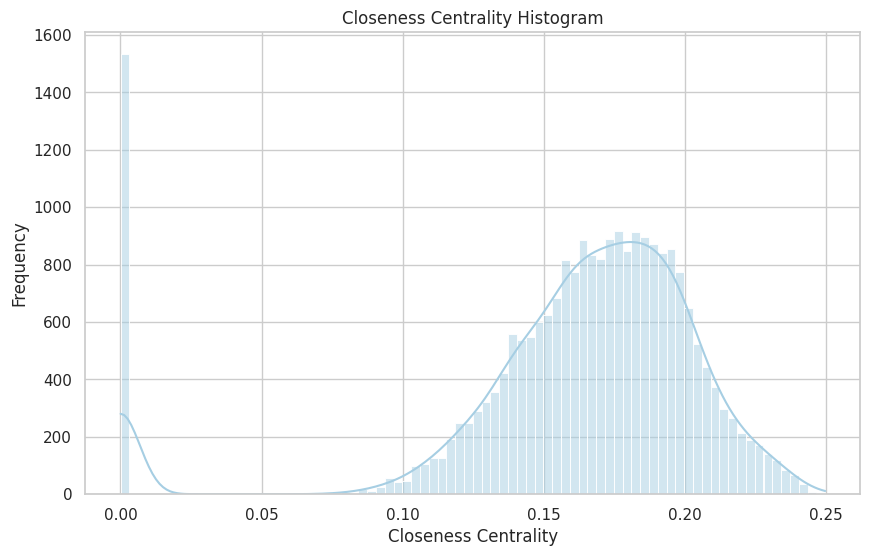

In [ ]:
# Extract the list of centrality values
closeness_values = list(closeness_centrality.values())

# Set the style and color palette for the plot
sns.set(style="whitegrid")
sns.set_palette("Paired")

# Plot the histogram of closeness centrality
plt.figure(figsize=(10, 6))
sns.histplot(closeness_values, bins='auto', kde=True)
plt.title("Closeness Centrality Histogram")
plt.xlabel("Closeness Centrality")
plt.ylabel("Frequency")
plt.show()

# **Clustering Coefficient**

In [ ]:
# Calculate the clustering coefficient for each node
node_clustering_coefficients = nx.clustering(G)

# Sort the dictionary by values and select the top 20 items
top_20_clustering = dict(sorted(node_clustering_coefficients.items(), key=lambda item: item[1], reverse=True)[:20])

# Print the clustering coefficient for the top 20 nodes
print("Top 20 Nodes with Highest Clustering Coefficients:")
for node, clustering_coefficient in top_20_clustering.items():
    print(f"{node}: {clustering_coefficient}")

Top 20 Nodes with Highest Clustering Coefficients:
Sam Qualiana: 1.0
John D'Leo: 1.0
Timothy Weinert: 1.0
Chris Willoughby: 1.0
Drena De Niro: 1.0
Nick Giannopoulos: 1.0
Marios Ioannou: 1.0
Michael Chomiak: 1.0
Melia Kreiling: 1.0
Neimah Djourabchi: 1.0
Colin Allen: 1.0
Michael Michele: 1.0
Linus Chung: 1.0
Chris Wilcox: 1.0
Clayton Boyd: 1.0
Arthur Brown: 1.0
Leslie Nielsen: 1.0
Marco Guzmán: 1.0
James Tackett: 1.0
Flo Jacobs: 1.0


In [ ]:
# Calculate the average clustering coefficient for the graph without taken into consideration the disconnected components
avg_clustering = nx.average_clustering(G, count_zeros=False)

# Print the average clustering coefficient
print(f"Average clustering coefficient = {avg_clustering}")

Average clustering coefficient = 0.4098309494095482


Text(0, 0.5, 'Counts')

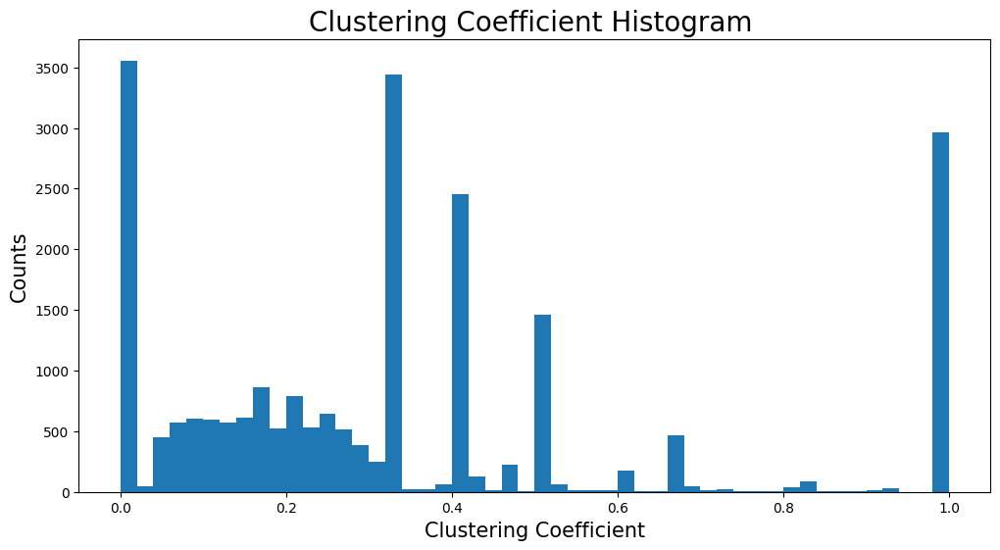

In [ ]:
plt.figure(figsize=(12, 6))
plt.hist(nx.clustering(G).values(), bins=50)
plt.title("Clustering Coefficient Histogram ", fontdict={"size": 20}, loc="center")
plt.xlabel("Clustering Coefficient", fontdict={"size": 15})
plt.ylabel("Counts", fontdict={"size": 15})

# **Community Detection**

## **Louvian Method**

In [ ]:
!pip install python-louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Community Detection
import community.community_louvain as community_louvain

partition = community_louvain.best_partition(G)

# Print the number of communities and the nodes in each community
num_communities = max(partition.values()) + 1
print("Number of communities: %d" % num_communities)

Number of communities: 619


In [ ]:
from collections import defaultdict

# Organize actors by community
communities = defaultdict(list)
for actor, community_id in partition.items():
    communities[community_id].append(actor)

# Sort communities by size and select the largest one
largest_community_id, largest_community = sorted(communities.items(), key=lambda x: len(x[1]), reverse=True)[0]

# Print the top 20 actors in the largest community
print("Top 20 actors in the largest community:")
for actor in largest_community[:20]:
    print(actor)

Top 20 actors in the largest community:
Mike Benitez
Chris Coppola
J. Richey Nash
Lawrence Pressman
Michael Jai White
James Tackett
Stephanie Drake
Rico Ball
Kira Pozehl
Maximillian Davis
Christopher Amitrano
Malika Blessing
Louis Mandylor
Stella Maeve
Bianca Lawson
Andrea Jungert
Deuandra T. Brown
Susan Priver
Myk Watford
Eric Callero


In [ ]:
# Count the number of nodes in each community
community_sizes = {}
for node, community_id in partition.items():
    if community_id not in community_sizes:
        community_sizes[community_id] = 0
    community_sizes[community_id] += 1

# Print the number of nodes in each community for the first 20 communities
for i in range(min(40, num_communities)):
    print("Community %d: %d nodes" % (i, community_sizes[i]))

Community 0: 1018 nodes
Community 1: 3041 nodes
Community 2: 1261 nodes
Community 3: 1056 nodes
Community 4: 809 nodes
Community 5: 2061 nodes
Community 6: 395 nodes
Community 7: 622 nodes
Community 8: 1388 nodes
Community 9: 3086 nodes
Community 10: 112 nodes
Community 11: 2 nodes
Community 12: 58 nodes
Community 13: 196 nodes
Community 14: 4 nodes
Community 15: 2 nodes
Community 16: 3 nodes
Community 17: 476 nodes
Community 18: 448 nodes
Community 19: 216 nodes
Community 20: 172 nodes
Community 21: 146 nodes
Community 22: 720 nodes
Community 23: 324 nodes
Community 24: 2 nodes
Community 25: 146 nodes
Community 26: 3 nodes
Community 27: 2 nodes
Community 28: 202 nodes
Community 29: 380 nodes
Community 30: 282 nodes
Community 31: 16 nodes
Community 32: 48 nodes
Community 33: 2 nodes
Community 34: 2 nodes
Community 35: 176 nodes
Community 36: 166 nodes
Community 37: 2 nodes
Community 38: 231 nodes
Community 39: 406 nodes


In [ ]:
pip install python-igraph

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 64.7 MB/s eta 0:00:00
  Created wheel for python-igraph: filename=python_igraph-0.10.4-py3-none-any.whl size=9073 sha256=ef2d3013fc41634797fa9cbb0d98182dbaf6ea3a6addefa799e95c4f44dc209a
  Stored in directory: /root/.cache/pip/wheels/49/27/15/dcf90953e3e3322e6f3e447514b20cf39b53c6518cb4a7bace
Successfully built python-igraph


In [ ]:
import networkx as nx
import igraph as ig

def networkx_to_igraph(G):
    mapping = dict(zip(G.nodes(), range(G.number_of_nodes())))
    reverse_mapping = dict(zip(range(G.number_of_nodes()), G.nodes()))
    ig_graph = ig.Graph(len(G), [(mapping[u], mapping[v]) for u, v in G.edges()])
    return ig_graph, reverse_mapping

ig_graph, reverse_mapping = networkx_to_igraph(G)


In [ ]:
clusters = ig_graph.community_multilevel()

# The `clusters` variable is a VertexClustering object containing the node-community membership
membership = clusters.membership

# If you need the membership with original node labels from the NetworkX graph:
membership_original_labels = {reverse_mapping[node]: community for node, community in enumerate(membership)}


In [ ]:
from collections import Counter

# Calculate the number of communities
num_communities = len(set(membership))
print(f"Number of communities: {num_communities}")

# Calculate the size of each community
community_sizes = Counter(membership)

# Calculate the average community size
avg_community_size = sum(community_sizes.values()) / num_communities
print(f"Average community size: {avg_community_size}")


Number of communities: 615
Average community size: 37.96910569105691


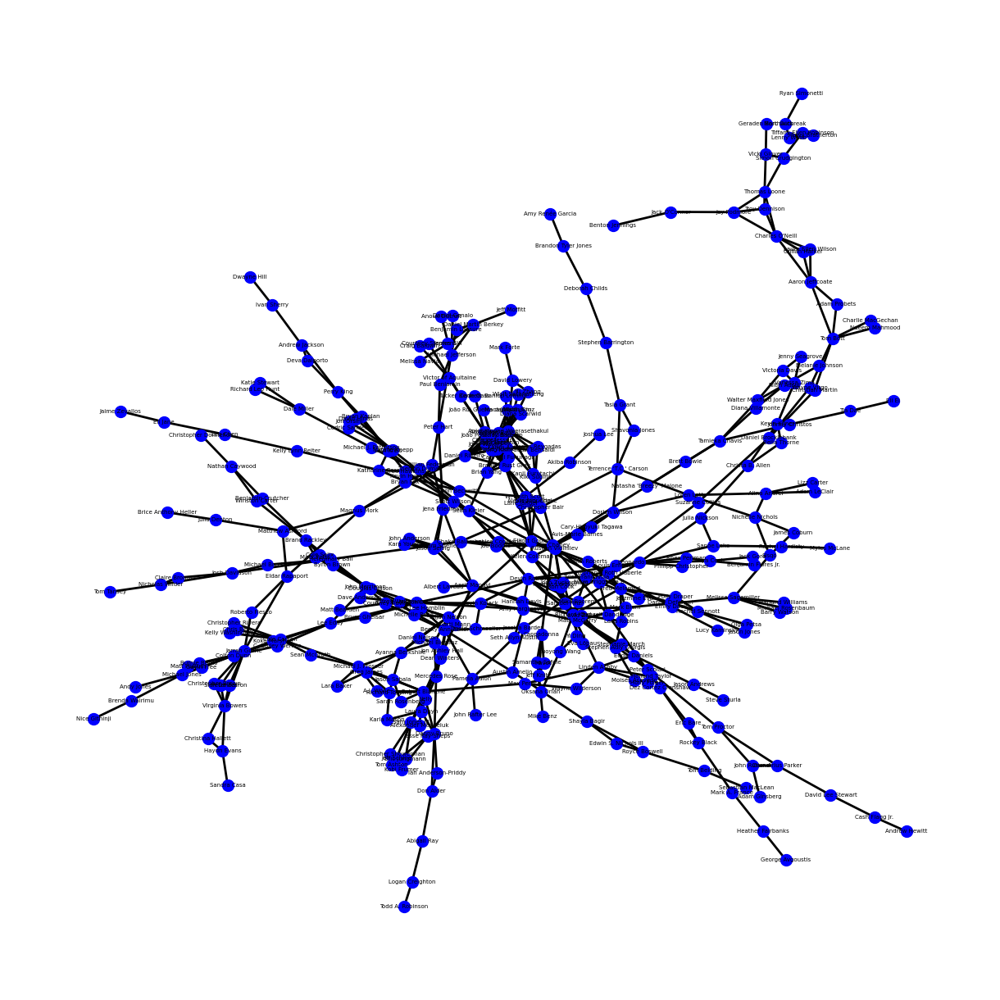

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Select a specific community to visualize
community_to_visualize = 20
nodes_in_community = [node for node, community in membership_original_labels.items() if community == community_to_visualize]

# Create a subgraph containing only the nodes in the selected community
subgraph = G.subgraph(nodes_in_community)

# Visualize the subgraph
pos = nx.spring_layout(subgraph)

# Set the figure size (width, height) in inches
plt.figure(figsize=(12, 12))

# Draw the subgraph with custom node size, label size, and edge width
node_size = 100
label_size = 5
edge_width = 2

nx.draw(subgraph, pos, node_size=node_size, node_color='blue', with_labels=False, width=edge_width)

# Draw node labels separately with custom font size
nx.draw_networkx_labels(subgraph, pos, font_size=label_size)

# Show the graph
plt.show()

## **Infomap Algorithm**

In [ ]:
pip install infomap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.1/263.1 kB 13.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for infomap: filename=infomap-2.7.1-cp310-cp310-linux_x86_64.whl size=8808760 sha256=aacfc0e2ced81ab074dd20fe82e49564a7ba2c2b01f7a56cebe4f1335bf1d189
  Stored in directory: /root/.cache/pip/wheels/e4/01/53/fd7c62079098140cd582b999592b4592c0dad7300cac32b6e1
Successfully built infomap


In [ ]:
import igraph as ig
import infomap

def networkx_to_igraph(G):
    mapping = dict(zip(G.nodes(), range(G.number_of_nodes())))
    reverse_mapping = dict(zip(range(G.number_of_nodes()), G.nodes()))
    ig_graph = ig.Graph(len(G), [(mapping[u], mapping[v]) for u, v in G.edges()])
    return ig_graph, reverse_mapping

ig_graph, reverse_mapping = networkx_to_igraph(G)


In [ ]:
# Create the Infomap instance
im = infomap.Infomap()

# Add nodes and edges to the Infomap instance
for v in ig_graph.vs:
    im.add_node(v.index)

for e in ig_graph.es:
    im.add_link(*e.tuple)

# Run the Infomap algorithm
im.run()


In [ ]:
from collections import defaultdict

communities = defaultdict(list)
for node in im.nodes:
  communities[node.module_id].append(node.node_id)

print(f"Number of communities: {len(communities)}")

counter = 0
for i, (community_id, nodes) in enumerate(communities.items()):
  if counter >= 10:
    break

  community_nodes = [reverse_mapping[node_id] for node_id in nodes]
  print(f"Community {i + 1}: {sorted(community_nodes)}")
  counter += 1


Number of communities: 567
Community 1: ['50 Cent', 'A Leslie Kies', 'A Martinez', 'A. Michelle Harleston', 'A.J. Benza', 'A.J. Buckley', 'A.J. Cook', 'A.J. Wone', 'AG. Longhurst', 'AJ Bowen', 'AJ Cedeno', 'AJ Meijer', 'AJ Michalka', 'Aakash Pandey', 'Aaliyah', 'Aalok Mehta', 'Aamir Khan', 'Aaron Abrams', 'Aaron Ashmore', 'Aaron Beelner', 'Aaron Blakely', 'Aaron Brooks', 'Aaron Burt', 'Aaron Carter', 'Aaron Costa Ganis', 'Aaron D. Spears', 'Aaron Dalla Villa', 'Aaron Douglas', 'Aaron Eckhart', 'Aaron Gaffey', 'Aaron Glenane', 'Aaron Groben', 'Aaron Heffernan', 'Aaron Hill', 'Aaron Himelstein', 'Aaron J. March', 'Aaron James', 'Aaron Jay Rome', 'Aaron Jeffcoate', 'Aaron Kleven', 'Aaron L. McGrath', 'Aaron Landon Bornstein', 'Aaron Massey', 'Aaron Milo', 'Aaron Monaghan', 'Aaron Moorhead', 'Aaron Paul', 'Aaron Pedersen', 'Aaron Poole', 'Aaron Priest', 'Aaron Ruell', 'Aaron Smith', 'Aaron Stanford', 'Aaron Stielstra', 'Aaron Taylor-Johnson', 'Aaron Thiara', 'Aaron Tveit', 'Aaron Webber', 

In [ ]:
from collections import defaultdict

communities = defaultdict(list)
for node in im.nodes:
    communities[node.module_id].append(node.node_id)
# Find the largest community
largest_community_size = 0
largest_community_id = None
for community_id, nodes in communities.items():
    community_size = len(nodes)
    if community_size > largest_community_size:
        largest_community_size = community_size
        largest_community_id = community_id

# Print the largest community
largest_community_nodes = [reverse_mapping[node_id] for node_id in communities[largest_community_id]]
print(f"Largest community (ID: {largest_community_id}): {len(largest_community_nodes)}")

Largest community (ID: 1): 17942


Visualizing community ID: 30


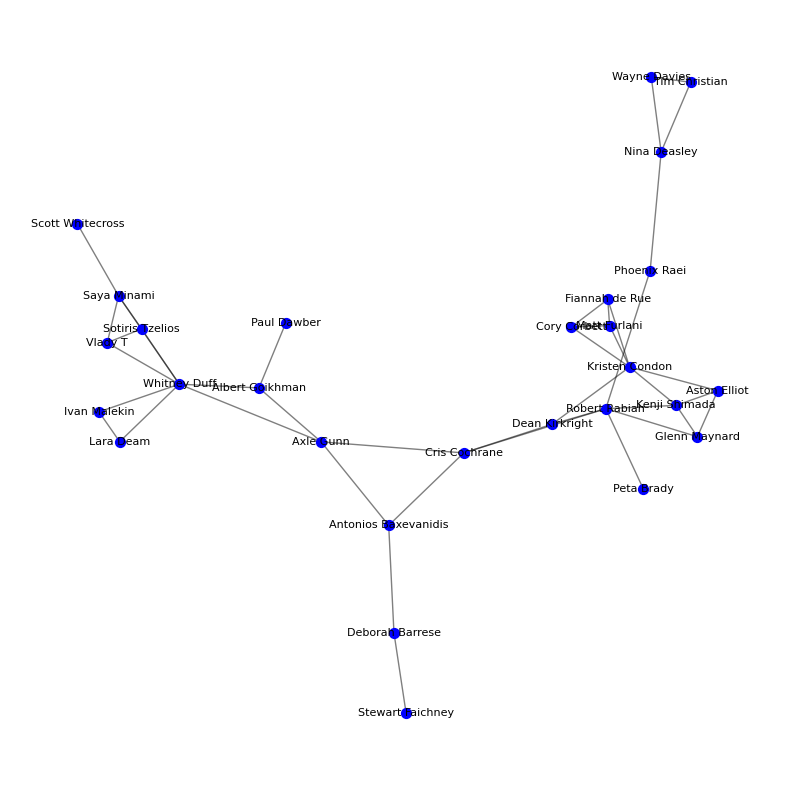

In [ ]:
community_id, nodes = list(communities.items())[29]
print(f"Visualizing community ID: {community_id}")
community_nodes = [reverse_mapping[node_id] for node_id in nodes]
community_subgraph = G.subgraph(community_nodes)

pos = nx.spring_layout(community_subgraph)
plt.figure(figsize=(10, 10))
plt.axis('off')
nx.draw_networkx_nodes(community_subgraph, pos, node_size=50, node_color='blue')
nx.draw_networkx_edges(community_subgraph, pos, alpha=0.5)
nx.draw_networkx_labels(community_subgraph, pos, font_size=8)
plt.show()



# **Dynamic Community Detection**

Part of Dynamic community 

In [ ]:
# Define the time window parameters
start_time = 0
end_time = 1

window_size = 30 * 24 * 60 * 60  # 30 days * 24 hours * 60 minutes * 60 seconds

# Initialize a dictionary to store community partitions for each time window
community_partitions = {}

# Iterate over time windows
for time in range(start_time, end_time, window_size):
    # Extract the snapshot of the network for the current time window
    snapshot = G.subgraph([node for node in G.nodes()])

    # Apply the Louvain algorithm to the snapshot
    partition = community.best_partition(snapshot)

    # Store the community partition for the current time window
    community_partitions[time] = partition

In [ ]:
# Track the evolution of communities
for time in range(start_time, end_time, window_size):
    current_partition = community_partitions[time]
    next_time = time + window_size
    next_partition = community_partitions.get(next_time, {})

    # Compare the communities between adjacent time windows
    for node in G.nodes():
        current_community = current_partition.get(node)
        next_community = next_partition.get(node)

        if current_community != next_community:
            # Community changed for this node between time windows
            # Handle the change (e.g., merge, split, or track community evolution)
            print(f"Node {node}: Community changed from {current_community} to {next_community}")

Streaming output truncated to the last 5000 lines.
Node Ali Larter: Community changed from 11 to None
Node Henrik Rafaelsen: Community changed from 0 to None
Node Catherine Missal: Community changed from 38 to None
Node Vanessa Kirby: Community changed from 11 to None
Node Cheech Marin: Community changed from 11 to None
Node Katharine Towne: Community changed from 11 to None
Node Carla Gugino: Community changed from 11 to None
Node Mac Brandt: Community changed from 2 to None
Node Anthony Okungbowa: Community changed from 11 to None
Node Camille Chen: Community changed from 2 to None
Node Vanessa Williams: Community changed from 2 to None
Node Phoebe Nicholls: Community changed from 18 to None
Node Prashant Prakash: Community changed from 20 to None
Node Aoi Miyazaki: Community changed from 42 to None
Node Jeremy Fiske: Community changed from 18 to None
Node Justin Shilton: Community changed from 97 to None
Node Monica Ochea: Community changed from 605 to None
Node Cyndi Crotts: Commun

In [ ]:
# Analyze and visualize the dynamic community structure
def analyze_community_evolution(community_partitions):
    print("Community Evolution Analysis:")
    for time, partition in community_partitions.items():
        print(f"Time: {time}")
        for node, community in partition.items():
            print(f"Node: {node} - Community: {community}")

analyze_community_evolution(community_partitions)

Streaming output truncated to the last 5000 lines.
Node: Ali Larter - Community: 11
Node: Henrik Rafaelsen - Community: 0
Node: Catherine Missal - Community: 38
Node: Vanessa Kirby - Community: 11
Node: Cheech Marin - Community: 11
Node: Katharine Towne - Community: 11
Node: Carla Gugino - Community: 11
Node: Mac Brandt - Community: 2
Node: Anthony Okungbowa - Community: 11
Node: Camille Chen - Community: 2
Node: Vanessa Williams - Community: 2
Node: Phoebe Nicholls - Community: 18
Node: Prashant Prakash - Community: 20
Node: Aoi Miyazaki - Community: 42
Node: Jeremy Fiske - Community: 18
Node: Justin Shilton - Community: 97
Node: Monica Ochea - Community: 605
Node: Cyndi Crotts - Community: 36
Node: Jackie Berroyer - Community: 6
Node: Jake Borelli - Community: 35
Node: Segun Arinze - Community: 12
Node: Marcus Mittermeier - Community: 6
Node: Richard Glover - Community: 4
Node: Gorio - Community: 588
Node: Hans de Kraker - Community: 220
Node: Christine Taylor - Community: 11
Node: D

Community Evolution Visualization:


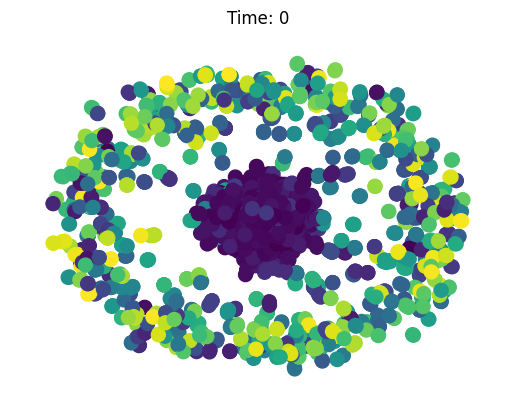

In [ ]:
# Visualize the dynamic community structure
def visualize_community_evolution(community_partitions):
    print("Community Evolution Visualization:")
    for time, partition in community_partitions.items():
        plt.figure()
        plt.title(f"Time: {time}")
        pos = nx.spring_layout(G)  # Layout for node positioning

        # Assign node colors based on community
        node_colors = [partition.get(node) for node in G.nodes()]

        nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap='viridis', node_size=100)
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        plt.axis('off')
        plt.show()

visualize_community_evolution(community_partitions)